## Chapter 13: Multi-layer Perceptrons 

# 13.5 Combating non-convexity with regularization

In [11]:
# This code cell will not be shown in the HTML version of this notebook
# imports from custom library

import sys
sys.path.append('../../')
import autograd.numpy as np
from mlrefined_libraries import *
%matplotlib notebook

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Composition of nonlinear functions makes the cost functions associated with neural networks associated non-convex. This means that one can no longer randomly initialize gradient descent (or any of its variants) and be sure the algorithm eventually finds the global minimum, as is the case with convex functions. This mere theoretical inconvenience does not preclude the use of non-convex cost functions, but motivates a variety of engineering fixes to the cost function, the optimizing algorithm, or both, which in practice allows us to use non-convex costs effectively in solving machine learning and deep learning problems.

As illustrated in Figure 1 non-convexity can manifest itself in a variety of ways, some of which are more problematic than the others. The first panel shows the kind of non-convex region that is completely benign as it poses no hindrance to gradient-based algorithms. The second panel shows the worst situation for local optimization methods in general, and gradient-based methods in particular: existence of local minima. These methods by nature cannot avoid local minima and by design halt at such points. The good news is, analysis of neural networks cost function backed by empirical evidence reveals that the local minima associated with such costs are usually of high quality, meaning that they return an objective value close to that of the global minimum [[1]](#bib_cell). The last two panels panels in Figure 1 show two other problematic areas that may be present in a non-convex function: a saddle point (third panel) and a flat (or nearly-flat) region (fourth panel).

<figure>
<img src= '../../mlrefined_images/tricks/nonconvexities.png' width="100%" height="auto"/>
<figcaption> <strong>Figure 1:</strong> <em> Four general types of non-convexity that may be present in a non-convex cost function: (first panel) a concave region, (second panel) local minima, (third panel) saddle point, and (fourth panel) a flat region. </em>
</figcaption>
</figure>

In this Section we show through several examples how regularization can sometimes help ameliorate the issues with saddle points and flat regions. As we have seen previously, the notion of regularization arises in various other contexts in machine learning as well, including overfitting prevention, feature selection, soft-margin support vector machines, and more. 

A regularizer can be thought of as a simple convex function that when added to a non-convex cost function, slightly convexifies it and thereby helps numerical optimization techniques avoid poor solutions at its saddle points or flat areas. One of the most common regularizers used in practice is the squared $\ell_2$ norm defined as 

\begin{equation}
\left\Vert \mathbf{\mathbf{w}}\right\Vert _{2}^{2} = \underset{n=1}{\overset{N}{\sum}}{w_{n}^2} 
\end{equation}

To regularize a cost function $g\left(w_0, \mathbf{w}\right)$ with this regularizer we simply add it to $g$ giving the regularized cost function

\begin{equation}
g\left(w_0, \mathbf{w}\right) + \lambda \left\Vert \mathbf{\mathbf{w}}\right\Vert _{2}^{2} 
\end{equation}

Here $\lambda \geq 0$ is a parameter controlling the strength of each term, the original cost function and the regularizer, in the final sum. For example, if $\lambda=0$ we have our original cost. On the other hand, if $\lambda$ is set very large then the regularizer drowns out the cost and we have $g\left(w_0, \mathbf{w}\right) + \lambda \left\Vert \mathbf{\mathbf{w}}\right\Vert _{2}^{2} \approx \lambda \left\Vert \mathbf{\mathbf{w}}\right\Vert _{2}^{2}$. Typically in practice $\lambda$ is set fairly small (e.g., $\lambda=0.1$ or smaller).


We now show several examples of simple non-convex cost functions which exemplify how regularization can help numerical techniques avoid many (but not all) poor solutions in practice.

#### <span style="color:#a50e3e;">Example 1. </span>  The effect of regularization on flat regions of a non-convex function

The left panel in the Python cell below shows the non-convex cost function


\begin{equation}
g_1(w) = \text{max}^{2} \left(0,\,\frac{1}{2}e^{-w} \text{sin} \left(4\pi \left(w − 0.1\right)\right)\right)
\end{equation}

defined over a symmetric interval about the origin, which has three large flat areas containing undesirable stationary points. This kind of non-convex function is highly problematic because if an algorithm like gradient descent is initialized at any point lying in these flat regions it will immediately halt.

Shown in the middle and right panels are the regularizer $g_2(w) = w^2$ and the regularized cost $g_1(w)+\lambda\, g_2(w)$. Moving the slider widget from left to right we gradually increase the regularization parameter from $\lambda=0$ to $\lambda=1$. 

Note how regularization convexifies the entire cost function, and in particular how it forces the flat regions to curve upwards. Now if gradient descent is initialized in either of the two flat regions on the left or right sides it will in fact travel downwards and reach a minimum.  Note in this instance, however, that regularization has not helped with the 
problem of gradient descent halting at a poor solution if initialized in the middle flat region of the original cost. That is, by regularizing we have actually created a local minimum near the middle of the original flat region in the regularized cost function, and so if gradient descent is initialized in this region it will halt at this undesirable solution.


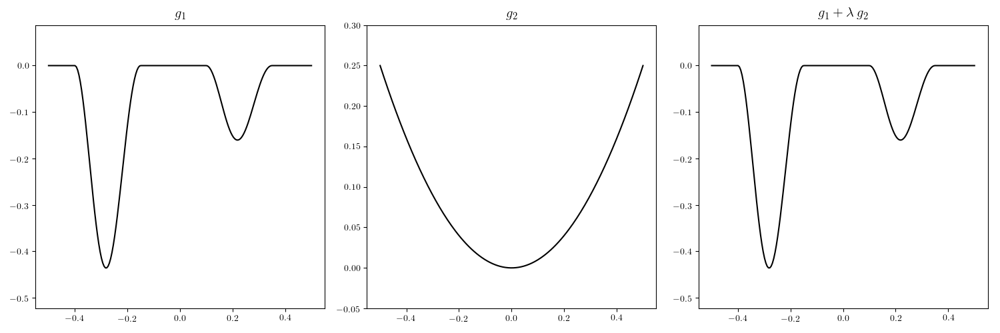
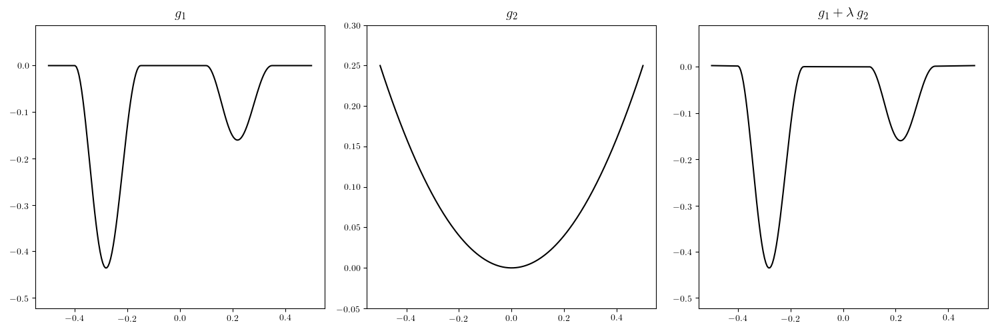
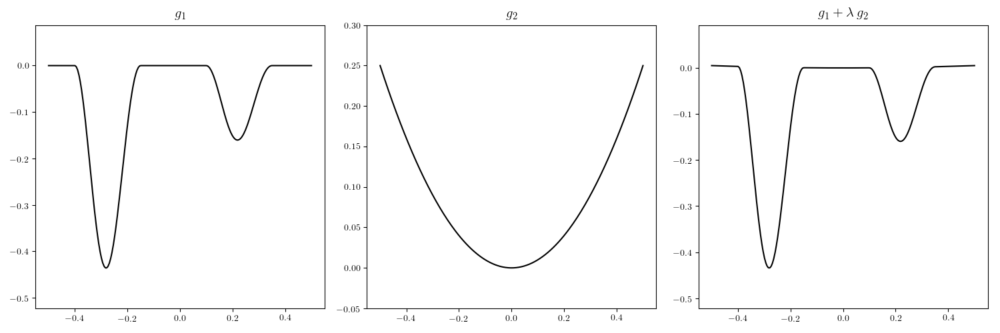
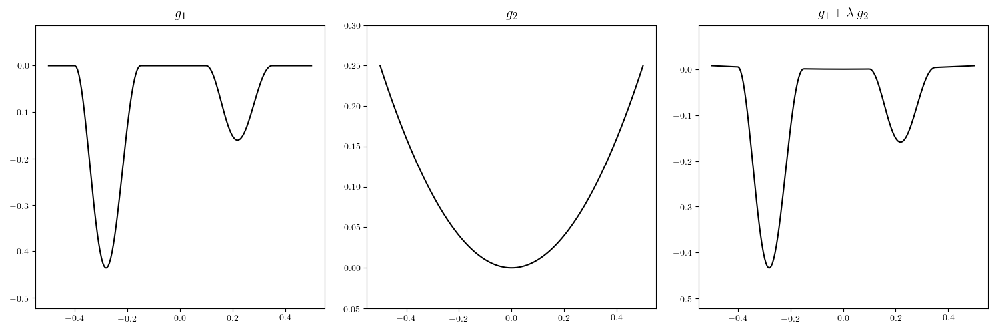
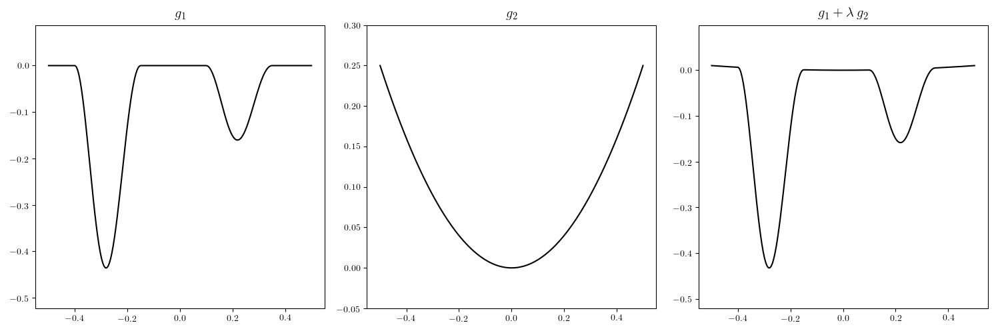
...
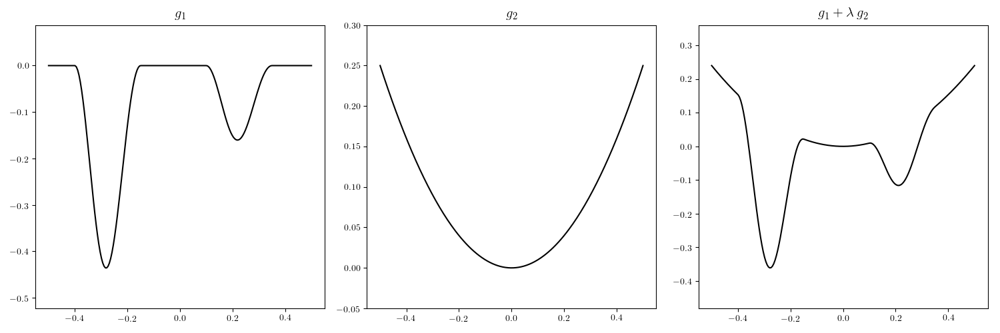
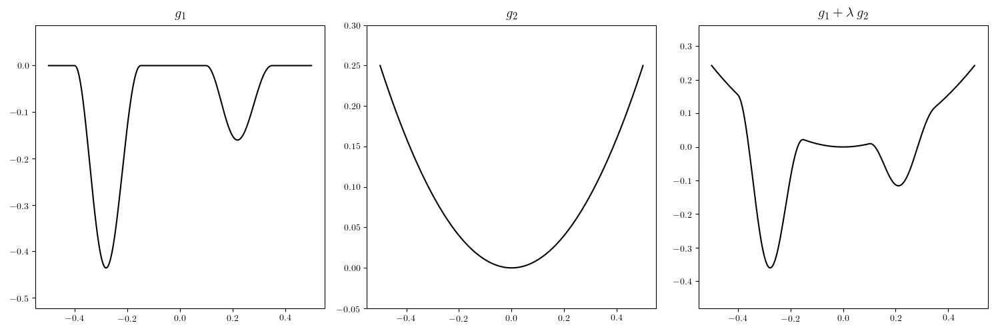
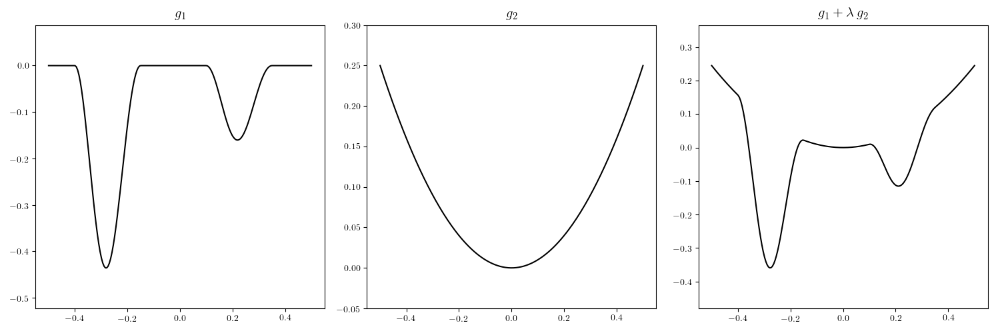
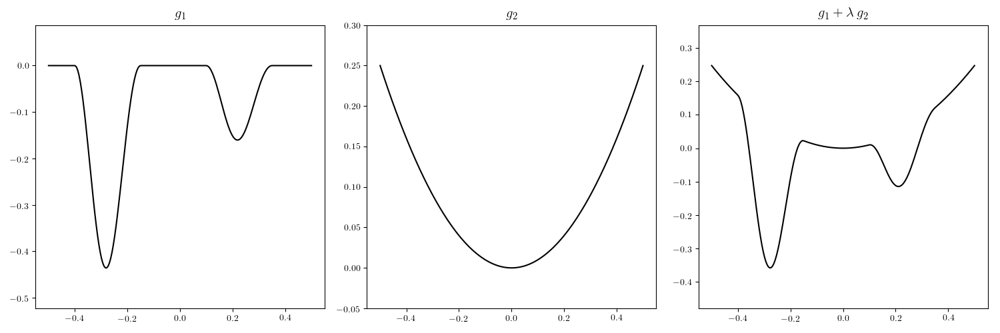
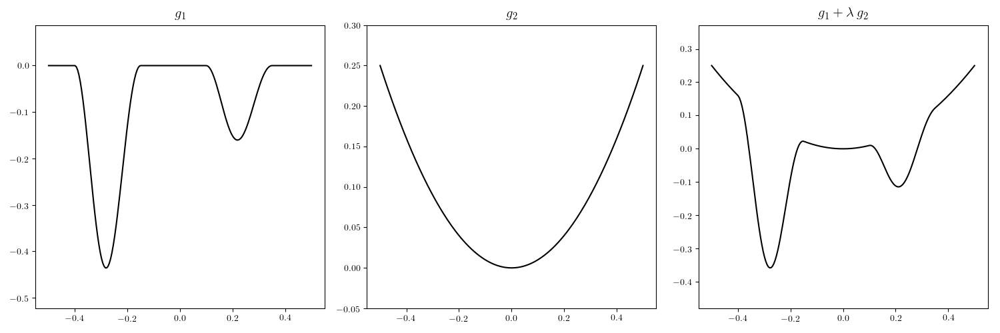

In [2]:
# what function should we play with?  Defined in the next line.
g1 = lambda w: -np.maximum(0,.5*np.exp(-w)*np.sin(4*np.pi*(w - 0.1)))**2
g2 = lambda w: w**2

# create an instance of the visualizer with this function
test = basics_library.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = g1,g2 = g2,num_slides = 50,min_range = -0.5,max_range = 0.5, alpha_range=(0,1), mode='regularization', title3='$g_1 + \\lambda\,g_2$')

#### <span style="color:#a50e3e;">Example 2. </span>  The effect of regularization on saddle points of a non-convex function

The left panel in this Example illustrates the non-convex cost function

\begin{equation}
g_1(w) = \text{max}^{2} \left(0,\,\left(3w-2.3\right)^3+1 \right)  + \text{max}^{2} \left(0,\,\left(-3w+0.7\right)^3+1 \right)
\end{equation}

defined over the unit interval, which has two saddle points at which the derivative is zero, and so at which gradient descent based methods will halt undesirably if initialized at a point corresponding to any region on the far left or right.

Shown in the middle and right panels are the regularizer $g_2(w) = w^2$ and the regularized cost $g_1(w)+\lambda\, g_2(w)$. Moving the slider widget from left to right we gradually increase the regularization parameter from $\lambda=0$ to $\lambda=1$. 

Notice, the regularized cost no longer has an issue with the saddle point on the right, as the region surrounding it has been curved upwards. However the saddle point on the left is still problematic, as regularizing the original cost has created a local minimum near the point that will cause gradient descent to continue to halt at an undesirable solution. Note that the global minimum has slightly changed position from the original cost, but as long as $\lambda$ is set relatively small this small change does not typically make a difference in practice.


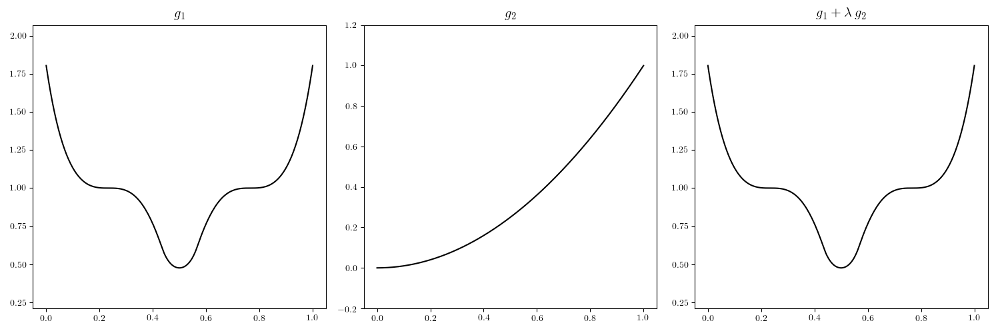
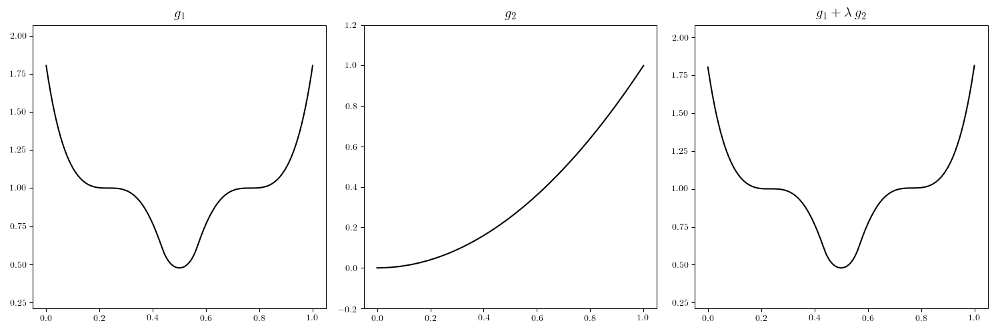
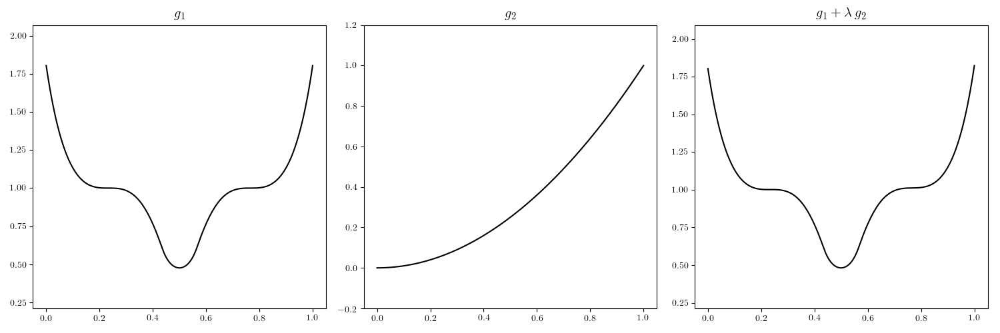
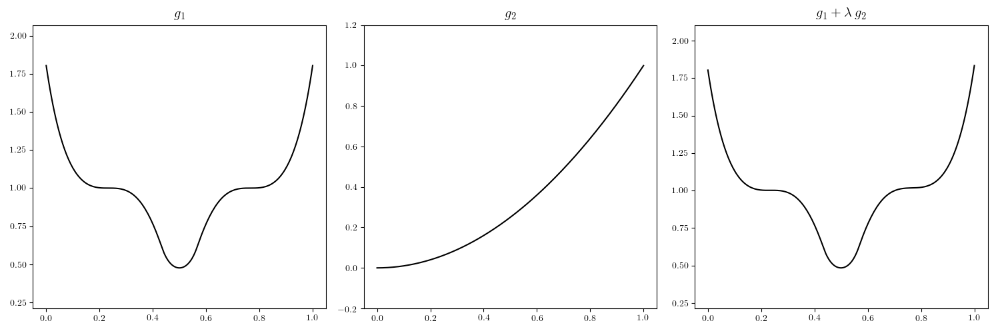
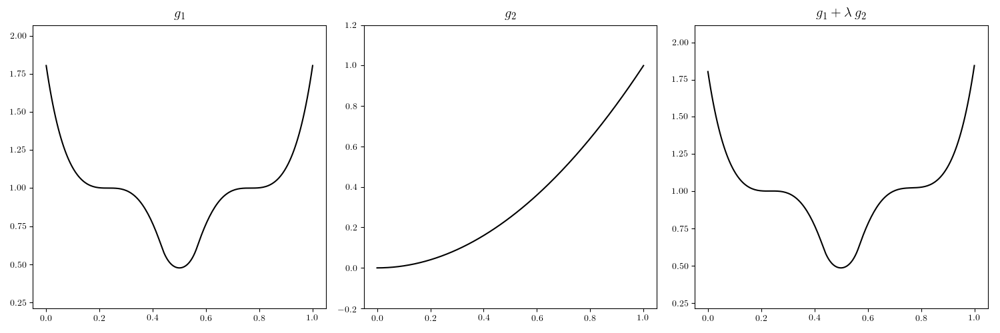
...
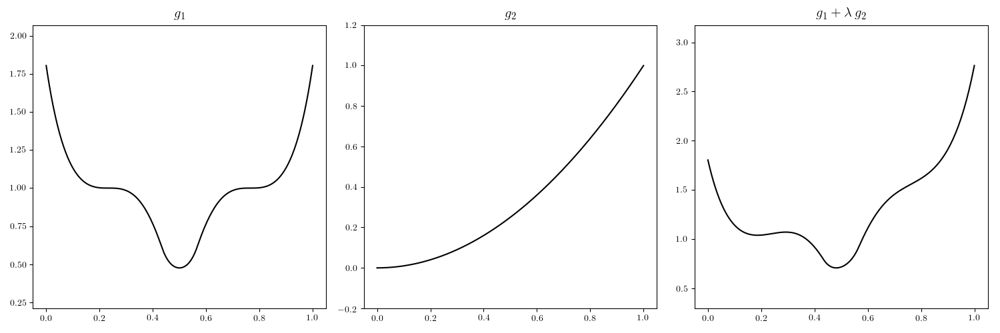
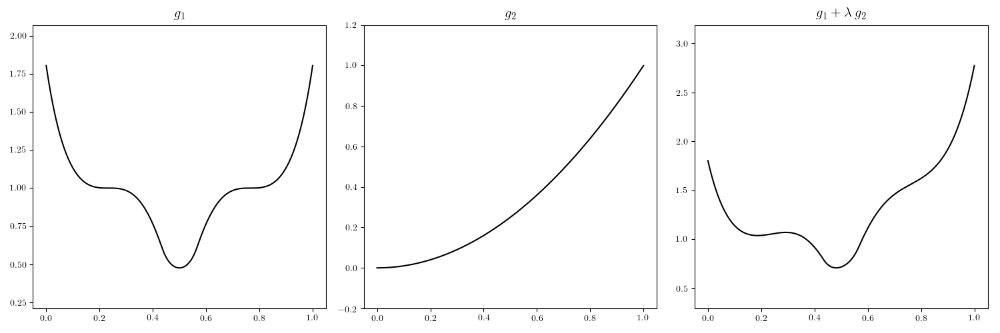
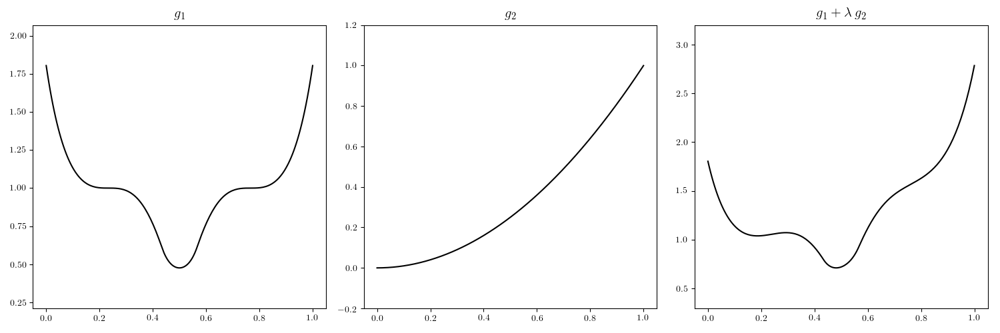
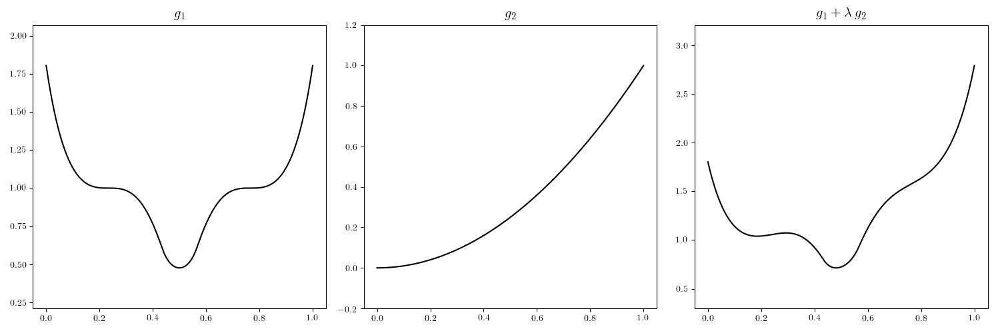
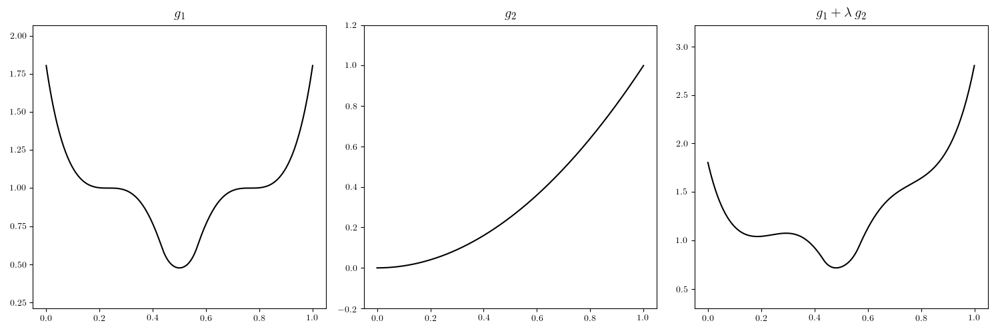

In [7]:
# what function should we play with?  Defined in the next line.
g1 = lambda w: np.maximum(0,(3*w - 2.3)**3 + 1)**2 + np.maximum(0, (-3*w + 0.7)**3 + 1)**2
g2 = lambda w: w**2

# create an instance of the visualizer with this function
test = basics_library.convex_function_addition_2d.visualizer()

# plot away
test.draw_it(g1 = g1,g2 = g2,num_slides = 50,min_range = 0,max_range = 1, alpha_range=(0,1), mode='regularization', title3='$g_1 + \\lambda\,g_2$')

#### <span style="color:#a50e3e;">Example 3. </span>  Bacterial growth

In this example and in the left panel of slider widget below we show a real regression dataset consisting of $P=9$ data points corresponding to the normalized cell concentration (output, $y$) of a particular bacteria, *Lactobacillus delbrueckii*, in spatially constrained laboratory conditions over the period of $24$ hours (input, $x$).

Also shown in the left panel are two sigmoidal fits (shown in magenta and green) of the form 

\begin{equation}
y(x) = \sigma \left(w_0 + w_1 x \right)
\end{equation}

where the parameters $w_0$ and $w_1$ of each are found via minimizing a Least Squares cost using gradient descent, initialized at two different points.


In the right panel we show the surface of the cost function which is clearly non-convex, having stationary points in the large flat region colored orange as well as a global minimum in the long narrow valley highlighted in dark blue. Two paths taken by initializing gradient descent at different values are shown in magenta and green, respectively, on the surface itself. 

While the initialization of the magenta path in the yellow-green area of the surface leads to the global minimum, which corresponds with the good sigmoidal fit in magenta shown in the left panel, the initialization of the green path in the large flat orange region leads to a poor solution, with corresponding poor fit shown in green in the left panel.

Moving the slider from its original position in the left to right, we add an $\ell_2$ regularizer to the original Lwast Squares cost with gradually increasing $\lambda$. In the leftmost and rightmost positions we have $\lambda = 0$ and $\lambda = 10^{-2}$, respectively. Notice how turning up $\lambda$ curves the flat regions of the surface upwards, helping gradient descent avoid poor solutions when initialized in these areas. However when $\lambda$ is set relatively large the minimum of the regularized cost moves further away from that of the original cost, leading to poorer fits. 


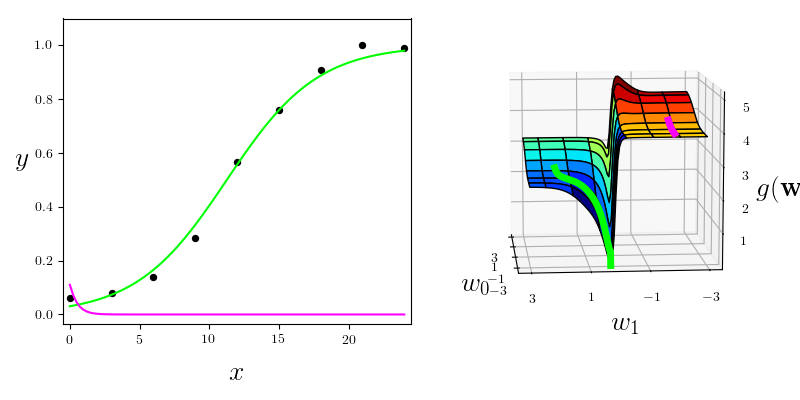
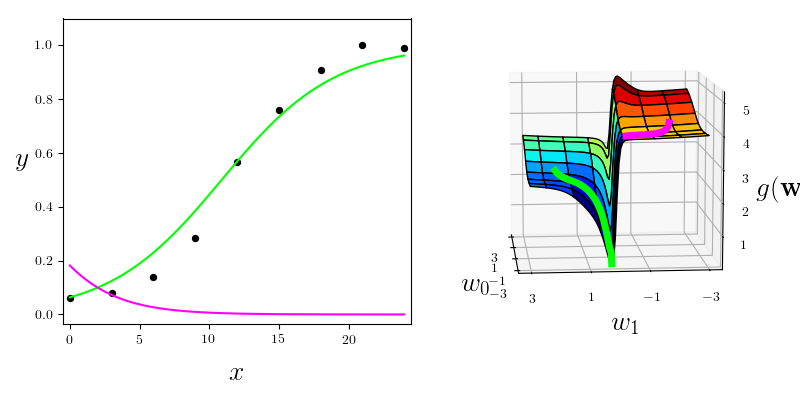
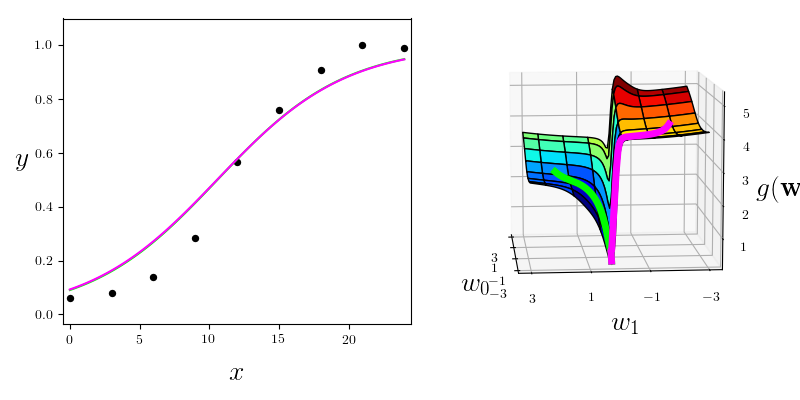
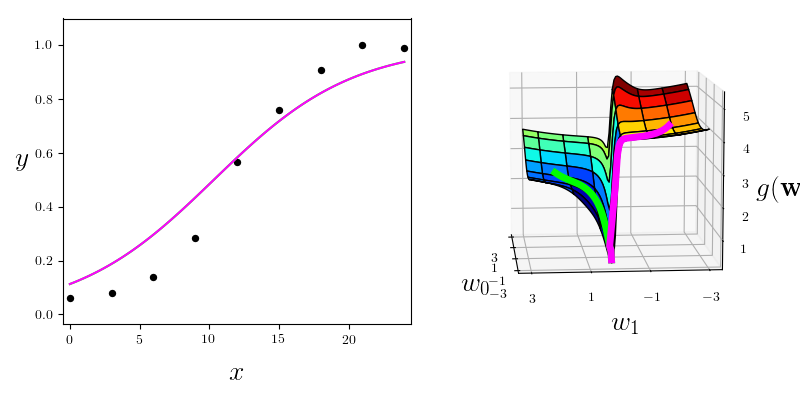
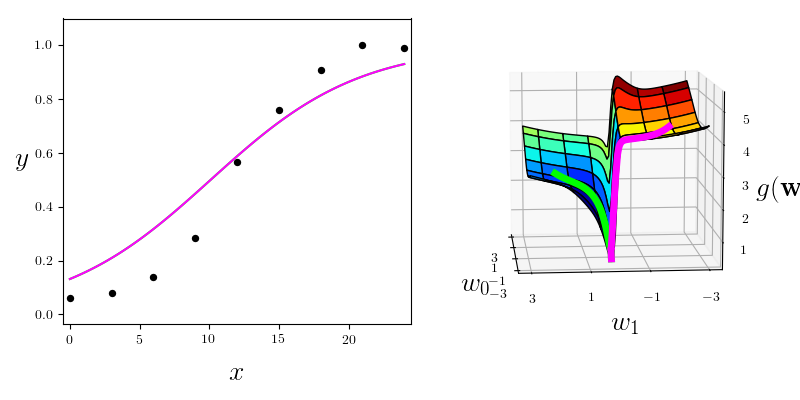
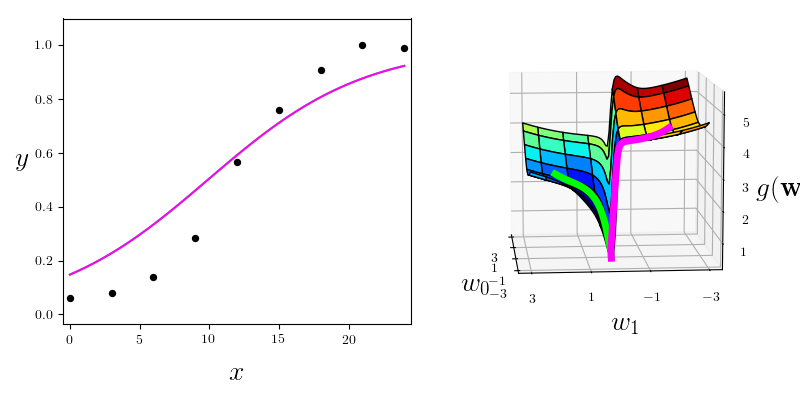
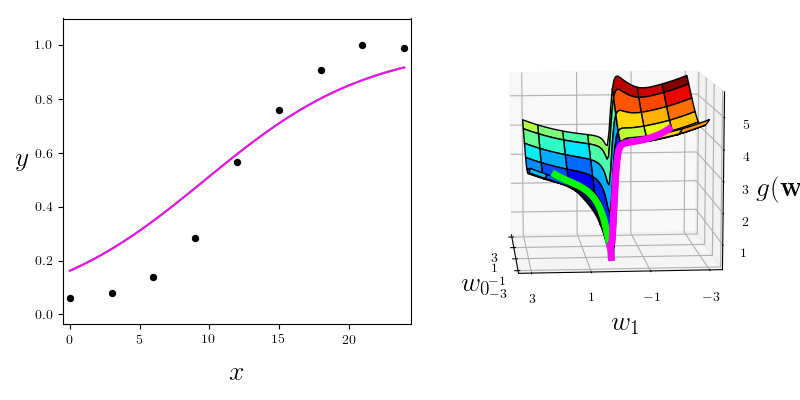
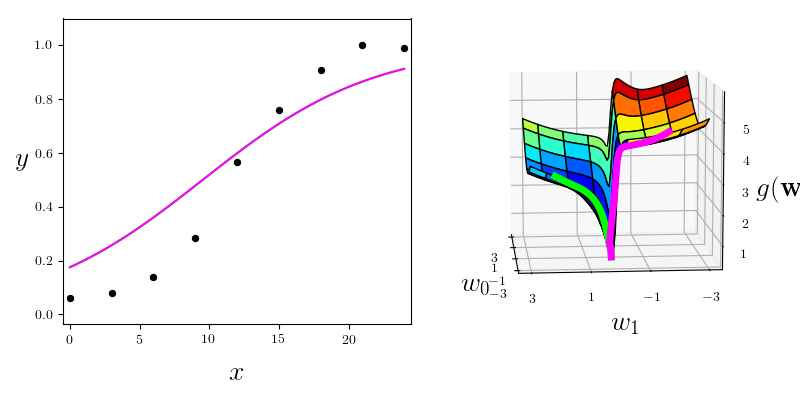
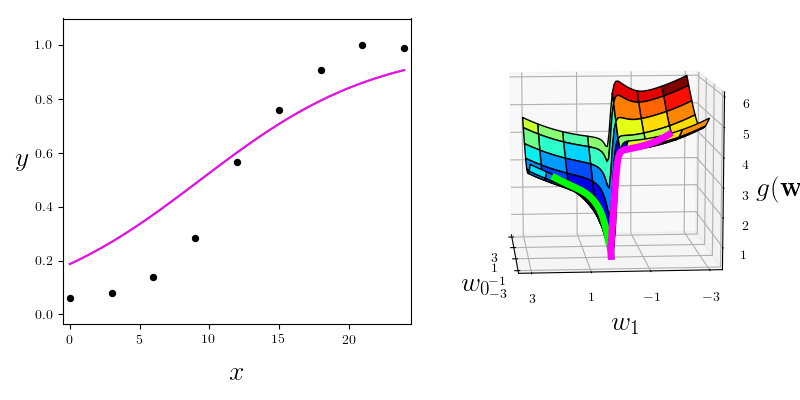
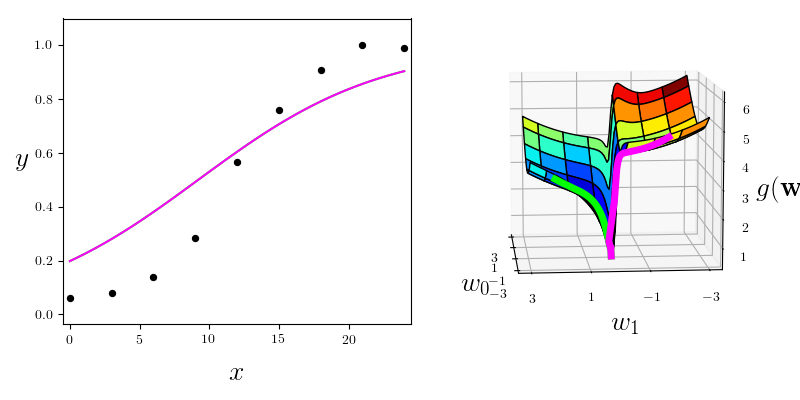

In [16]:
test = basics_library.regularization.visualizer()

w_init_1 = [0,2]
w_init_2 = [0,-2]
lam_range = 0
max_its = 5000

test.run_example(w_init_1 = w_init_1, w_init_2 = w_init_2, max_its = max_its)

<a id='bib_cell'></a>

## References

[1]  A. Choromanska, M. Henaff, M. Mathieu, G. Ben Arous, and Y. LeCun. The Loss Surfaces of Multilayer Networks. 
In Proceedings of the Eighteenth International Conference on Artificial Intelligence and Statistics (AISTATS), 2015.